LEVEL 2 TASK 1

In [1]:
import pandas as pd

In [2]:
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("Dataset.csv")

In [4]:
aggregate_rating = df['Aggregate rating']
rating_counts = aggregate_rating.value_counts().sort_index()

In [6]:
most_commom_rating_range = rating_counts.idxmax()
print("Most common rating range: " , most_commom_rating_range)

Most common rating range:  0.0


In [8]:
average_votes = df['Votes'].mean()
print("average number of votes received by restaurants: " , average_votes)

average number of votes received by restaurants:  156.909747670401


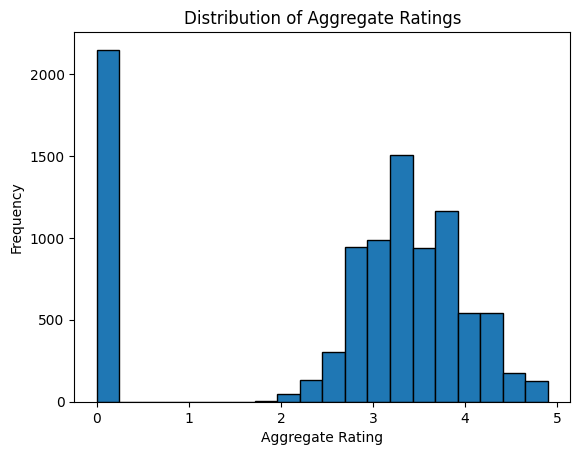

In [13]:
plt.hist(aggregate_rating, bins=20, edgecolor='black')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Aggregate Ratings')
plt.show()

TASK 2 

In [14]:
cuisines = df["Cuisines"]
aggregate_ratings = df["Aggregate rating"]


In [15]:
cuisine_combinations_counts = cuisines.value_counts()

In [18]:
most_common_cuisine_combinations = cuisine_combinations_counts.head(10)
print("Most common cuisine combinations:")
print(most_common_cuisine_combinations)

Most common cuisine combinations:
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [19]:
cuisine_combinations_avg_rating = df.groupby('Cuisines')['Aggregate rating'].mean()

In [20]:
top_10_avg_ratings = cuisine_combinations_avg_rating.nlargest(10)
print("|nAverage rating for thr top 10 cuisine combinations: ")
print(top_10_avg_ratings)

|nAverage rating for thr top 10 cuisine combinations: 
Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


TASK 3

In [5]:
pip install folium

  Obtaining dependency information for folium from https://files.pythonhosted.org/packages/b9/98/9ba4b9d2d07dd32765ddb4e4c189dcbdd7dca4d5a735e2e4ea756f40c36b/folium-0.16.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for branca>=0.6.0 from https://files.pythonhosted.org/packages/75/ca/6074ab4a04dd1a503201c18091b3426f3709670115fae316907a97f98d75/branca-0.7.2-py3-none-any.whl.metadata
  Obtaining dependency information for xyzservices from https://files.pythonhosted.org/packages/b7/2c/08768a39947864fcebc19f059b758d8169a2ac183a61361359f56c144f7c/xyzservices-2024.4.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/100.0 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/100.0 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/100.0 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/100.0 kB ? eta -:--:--
   --------------- ----------------------- 41.0/100.0 kB 196.9 kB/s eta 0:00:01
   --------------


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
pip install scikit-learn

  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/79/3d/02d5d3ed359498fec3abdf65407d3c07e3b8765af17464969055aaec5171/scikit_learn-1.4.2-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for scipy>=1.6.0 from https://files.pythonhosted.org/packages/d4/a1/d4adf25b6d2bef8d0ad1682829dcfcba97f3f96bb5b6f137bc3e41003cc7/scipy-1.13.0-cp311-cp311-win_amd64.whl.metadata
     ---------------------------------------- 0.0/60.6 kB ? eta -:--:--
     ------ --------------------------------- 10.2/60.6 kB ? eta -:--:--
     ------------------- ------------------ 30.7/60.6 kB 325.1 kB/s eta 0:00:01
     -------------------------------- ----- 51.2/60.6 kB 327.7 kB/s eta 0:00:01
     -------------------------------- ----- 51.2/60.6 kB 327.7 kB/s eta 0:00:01
     -------------------------------------- 60.6/60.6 kB 267.8 kB/s eta 0:00:00
  Obtaining dependency information for joblib>=1.2.0 from https://files.pythonhosted.org/packages/91/29/d


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
import pandas as pd
import folium
from IPython.display import display
from sklearn.cluster import KMeans

ModuleNotFoundError: No module named 'sklearn'

In [3]:
import pandas as pd
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [4]:
df = pd.read_csv('Dataset.csv')

In [5]:
restaurant_names = df["Restaurant Name"]
latitude = df["Latitude"]
longitude = df["Longitude"]

In [6]:
x = df[["Latitude" , "Longitude"]]
num_clusters = 5

In [11]:
kMeans = KMeans(n_clusters = num_clusters, random_state = 42)
df["Cluster"] = kMeans.fit_predict(x)

In [18]:
map_center = [latitude.mean(), longitude.mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

In [19]:
cluster_colors = ['red' , 'blue' , 'green' , 'purple' , 'orange' ]

In [24]:
for index, row in df.iterrows():
    restaurants_name = row["Restaurant Name"]
    latitude = row["Latitude"]
    longitude = row["Longitude"]
    cuisines = row["Cuisines"]
    rating = row["Aggregate rating"]
    cluster = row["Cluster"]

    popup_text = f"Restaurants: (restaurant_name)\nCuisines : (cuisines)\nRating: (rating)"
    marker = folium.Marker([latitude,longitude], popup=popup_text)
    marker.add_to(restaurant_map)

In [26]:
display(restaurant_map)

TASK 4 

In [31]:
restaurant_chains = df.groupby("Restaurant Name").size().reset_index(name = "Chain Count")
restaurant_chains = restaurant_chains[restaurant_chains["Chain Count"]>1]

In [34]:
restaurant_chains = restaurant_chains.sort_values(by="Chain Count", ascending = False)

In [36]:
import matplotlib.pyplot as plt

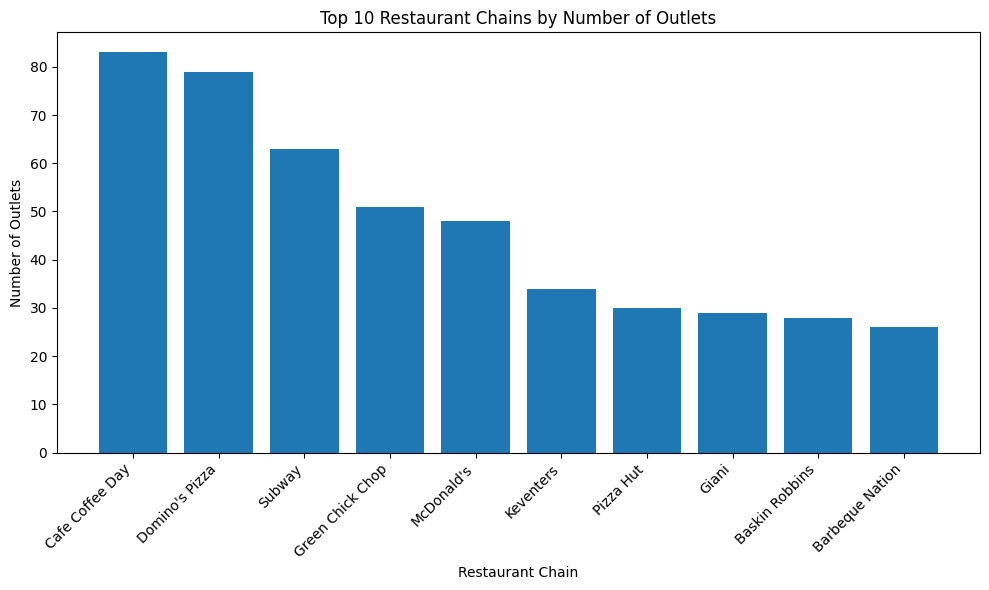

In [40]:
plt.figure(figsize=(10,6))
plt.bar(restaurant_chains["Restaurant Name"][:10], restaurant_chains["Chain Count"][:10])
plt.xticks(rotation=45,ha='right')
plt.xlabel("Restaurant Chain")
plt.ylabel("Number of Outlets")
plt.title("Top 10 Restaurant Chains by Number of Outlets")
plt.tight_layout()
plt.show()


In [41]:
chain_ratings = df.groupby("Restaurant Name")["Aggregate rating"].mean().reset_index(name="Average Rating")
chain_votes = df.groupby("Restaurant Name")["Votes"].sum().reset_index(name="Total Votes")

In [42]:
chain_analysis = pd.merge(chain_ratings, chain_votes, on="Restaurant Name")

In [43]:
chain_analysis = chain_analysis.sort_values(by="Average Rating", ascending = False)

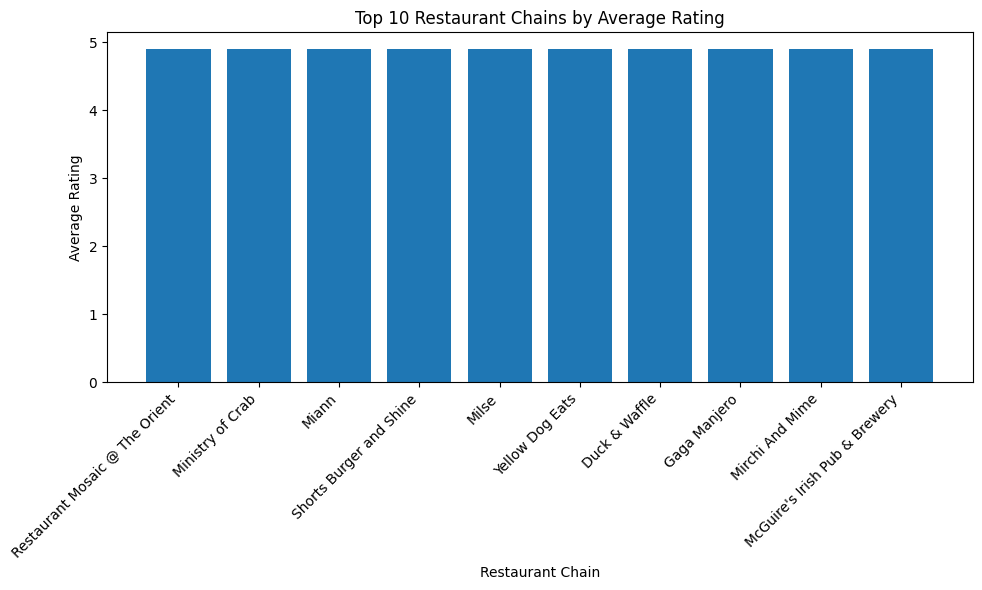

In [44]:
plt.figure(figsize=(10,6))
plt.bar(chain_analysis["Restaurant Name"][:10], chain_analysis["Average Rating"][:10])
plt.xticks(rotation=45,ha='right')
plt.xlabel("Restaurant Chain")
plt.ylabel("Average Rating")
plt.title("Top 10 Restaurant Chains by Average Rating")
plt.tight_layout()
plt.show()


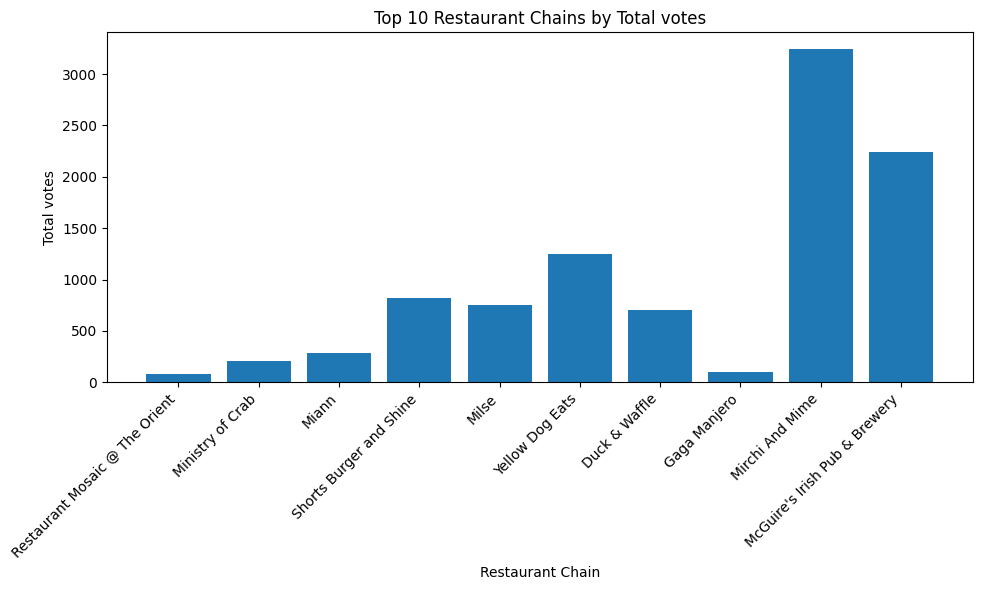

In [45]:
plt.figure(figsize=(10,6))
plt.bar(chain_analysis["Restaurant Name"][:10], chain_analysis["Total Votes"][:10])
plt.xticks(rotation=45,ha='right')
plt.xlabel("Restaurant Chain")
plt.ylabel("Total votes")
plt.title("Top 10 Restaurant Chains by Total votes")
plt.tight_layout()
plt.show()

In [47]:
print("Top 10 Restaurant Chains by number of outlets: ")
print(restaurant_chains[["Restaurant Name", "Chain Count"]].head(10))

Top 10 Restaurant Chains by number of outlets: 
       Restaurant Name  Chain Count
1098   Cafe Coffee Day           83
2098    Domino's Pizza           79
6106            Subway           63
2716  Green Chick Chop           51
4077        McDonald's           48
3478         Keventers           34
4961         Pizza Hut           30
2619             Giani           29
680     Baskin Robbins           28
663    Barbeque Nation           26


In [49]:
print("Top 10 Restaurant Chains by Total Votes: ")
print(chain_analysis[["Restaurant Name", "Total Votes"]].head(10))

Top 10 Restaurant Chains by Total Votes: 
                     Restaurant Name  Total Votes
5322  Restaurant Mosaic @ The Orient           85
4177                Ministry of Crab          203
4135                           Miann          281
5757         Shorts Burger and Shine          820
4165                           Milse          754
7339                 Yellow Dog Eats         1252
2133                   Duck & Waffle          706
2559                    Gaga Manjero           95
4182                 Mirchi And Mime         3244
4078   McGuire's Irish Pub & Brewery         2238
